In [11]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Display of image from KITTI dataset: both left and right images

In [12]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np


In [13]:
base_path = "/kaggle/input/kitti-dataset"
left_img_dir = os.path.join(base_path, "data_object_image_2", "training", "image_2")
right_img_dir = os.path.join(base_path, "data_object_image_3", "training", "image_3")

In [14]:
img_index = "000002"
left_img_path = os.path.join(left_img_dir, f"{img_index}.png")
right_img_path = os.path.join(right_img_dir, f"{img_index}.png")

# Load images using OpenCV
left_img = cv2.imread(left_img_path)
right_img = cv2.imread(right_img_path)

# Convert BGR (OpenCV default) to RGB for matplotlib
left_img_rgb = cv2.cvtColor(left_img, cv2.COLOR_BGR2RGB)
right_img_rgb = cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB)


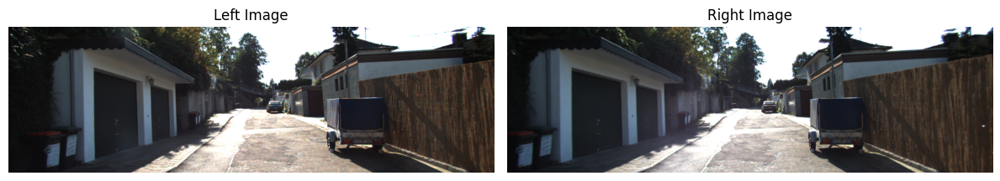

In [15]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.title("Left Image")
plt.imshow(left_img_rgb)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Right Image")
plt.imshow(right_img_rgb)
plt.axis("off")

plt.tight_layout()
plt.show()

# Pre-processing the dataset

So, I basically chatGPT-ed most of the pre processing and it gave me the following steps:
* Reading camera calibration (to understand how the stereo cameras are aligned)
* Image rectification (aligning the left and right images perfectly)
* (Optional) Undistortion (if distortion exists)
* Resizing, normalization, cropping, etc. (depending on model input requirements)
* Generating disparity maps (can help create depth maps later)

Changes made:
* Disparity maps were generated before resizing and normalization
* the produced disp maps were then furthur resized and normalized

## Read Camera Caliberation

In [16]:
def read_calib_file(file_path):
    calib_data = {}
    with open(file_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            if ':' in line:
                key, value = line.split(':', 1)
                calib_data[key] = np.array([float(x) for x in value.strip().split()])
    return calib_data

### Sample calliberation for one image (to test and understand what's happening - crying)

In [17]:
# SAMPLE CALLIBERATION: ONLY FOR ONE IMAGE

calib_path = "/kaggle/input/kitti-dataset/data_object_calib/training/calib/000000.txt"
calib = read_calib_file(calib_path)

P0 = calib["P0"].reshape(3, 4)  # Left camera (image_2)
P1 = calib["P1"].reshape(3, 4)  # Right camera (image_3)

# OPTIONAL CALCULATION OF FOCAL_LENGTH AND BASELINE
focal_length = P0[0, 0]
baseline = abs(P0[0, 3] - P1[0, 3]) / focal_length

print(f"Index :\nP0:\n{P0}\nP1:\n{P1}\n")

Index :
P0:
[[707.0493   0.     604.0814   0.    ]
 [  0.     707.0493 180.5066   0.    ]
 [  0.       0.       1.       0.    ]]
P1:
[[ 707.0493    0.      604.0814 -379.7842]
 [   0.      707.0493  180.5066    0.    ]
 [   0.        0.        1.        0.    ]]



### Reading of all camera calliberations

In [18]:
def load_all_calibrations(calib_dir):
    """
    Loads all calibration files in a directory into a dictionary.
    Each key is the file index (e.g., '000000'), and the value is its calibration data.
    """
    all_calibs = {}
    for fname in sorted(os.listdir(calib_dir)):
        if fname.endswith('.txt'):
            idx = fname.split('.')[0]
            calib_data = read_calib_file(os.path.join(calib_dir, fname))
            all_calibs[idx] = calib_data
    return all_calibs

In [19]:
calib_dir = "/kaggle/input/kitti-dataset/data_object_calib/training/calib/"
all_calibs = load_all_calibrations(calib_dir)

# Access individual projection matrices
for idx, calib in list(all_calibs.items())[:3]:  # show first 3 for demo
    P0 = calib["P0"].reshape(3, 4)
    P1 = calib["P1"].reshape(3, 4)
    print(f"Index {idx}:\nP0:\n{P0}\nP1:\n{P1}\n")

Index 000000:
P0:
[[707.0493   0.     604.0814   0.    ]
 [  0.     707.0493 180.5066   0.    ]
 [  0.       0.       1.       0.    ]]
P1:
[[ 707.0493    0.      604.0814 -379.7842]
 [   0.      707.0493  180.5066    0.    ]
 [   0.        0.        1.        0.    ]]

Index 000001:
P0:
[[721.5377   0.     609.5593   0.    ]
 [  0.     721.5377 172.854    0.    ]
 [  0.       0.       1.       0.    ]]
P1:
[[ 721.5377    0.      609.5593 -387.5744]
 [   0.      721.5377  172.854     0.    ]
 [   0.        0.        1.        0.    ]]

Index 000002:
P0:
[[721.5377   0.     609.5593   0.    ]
 [  0.     721.5377 172.854    0.    ]
 [  0.       0.       1.       0.    ]]
P1:
[[ 721.5377    0.      609.5593 -387.5744]
 [   0.      721.5377  172.854     0.    ]
 [   0.        0.        1.        0.    ]]



**SAVING CALIB DATA WITH PICKLE: this is simply so that we don't have to run the upar wala code again and again (takes time uk, im low on patience and time)**

**NOT A REQUIRED STEP**

In [20]:
import pickle

# Saving the file
with open("calliberation_data.pkl", "wb") as f:
    pickle.dump(all_calibs, f)

# Load from file
with open("calliberation_data.pkl", "rb") as f:
    all_calibs = pickle.load(f)

### Image rectification

In [21]:
def decompose_projection_matrix(P):
    K, R, t, _, _, _, _ = cv2.decomposeProjectionMatrix(P)
    K = K / K[2, 2]
    t = t / t[3]
    return K, R, t[:3]

In [22]:
def rectify_images(left_img_rgb, right_img_rgb, P0, P1):
    K0, R0, t0 = decompose_projection_matrix(P0)
    K1, R1, t1 = decompose_projection_matrix(P1)

    img_size = (left_img_rgb.shape[1], left_img_rgb.shape[0])
    R = R1 @ R0.T
    T = t1 - t0

    R1_rect, R2_rect, P1_rect, P2_rect, Q, _, _ = cv2.stereoRectify(
        K0, None, K1, None, img_size, R, T,
        flags=cv2.CALIB_ZERO_DISPARITY, alpha=0
    )

    map1x, map1y = cv2.initUndistortRectifyMap(K0, None, R1_rect, P1_rect, img_size, cv2.CV_32FC1)
    map2x, map2y = cv2.initUndistortRectifyMap(K1, None, R2_rect, P2_rect, img_size, cv2.CV_32FC1)

    rectified_left = cv2.remap(left_img_rgb, map1x, map1y, cv2.INTER_LINEAR)
    rectified_right = cv2.remap(right_img_rgb, map2x, map2y, cv2.INTER_LINEAR)

    return rectified_left, rectified_right

### Generating Disparity maps BEFORE normalization
Normalization butchers the image (adds undistortion to the images which the images don't initialy have) and hence disparity maps come v L. Since the images are already undistorted, we are first generating the disparity maps and then proceeding with resizing and normalization

In [23]:
def generate_disparity_map(rect_left, rect_right):
    gray_left = cv2.cvtColor(rect_left, cv2.COLOR_RGB2GRAY)
    gray_right = cv2.cvtColor(rect_right, cv2.COLOR_RGB2GRAY)

    min_disp = 0
    num_disp = 16 * 6
    block_size = 15

    stereo = cv2.StereoSGBM_create(
        minDisparity=min_disp,
        numDisparities=num_disp,
        blockSize=block_size,
        P1=8 * 3 * block_size ** 2,
        P2=32 * 3 * block_size ** 2,
        mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY
    )

    disparity = stereo.compute(gray_left, gray_right).astype(np.float32) / 16.0
    return disparity

In [24]:
def normalize_disparity(disparity):
    disparity[disparity < 0] = 0  # Optional: remove invalids
    disp_min = np.min(disparity)
    disp_max = np.max(disparity)
    if disp_max - disp_min > 0:
        norm_disparity = (disparity - disp_min) / (disp_max - disp_min)
    else:
        norm_disparity = disparity
    return norm_disparity

def resize_image(image, target_size=(224, 224)):
    return cv2.resize(image, target_size, interpolation=cv2.INTER_LINEAR)


### Image resize and normalization (WITHOUT disparity)

In [25]:
def preprocess_for_model(img, resize_dims=(256, 256), crop_size=(224, 224)):
    img = cv2.resize(img, resize_dims, interpolation=cv2.INTER_LINEAR)
    img = img.astype(np.float32) / 255.0
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = (img - mean) / std

    # Optional center crop
    if crop_size:
        h, w = img.shape[:2]
        ch, cw = crop_size
        start_x = (w - cw) // 2
        start_y = (h - ch) // 2
        img = img[start_y:start_y+ch, start_x:start_x+cw]

    return img

### Visualizing (for one image only):

In [26]:
import glob

right_imgs = glob.glob("/kaggle/input/kitti-dataset/data_object_image_3/training/image_3/*.png")
print("Sample Right Images:", right_imgs[:5])


Sample Right Images: ['/kaggle/input/kitti-dataset/data_object_image_3/training/image_3/005084.png', '/kaggle/input/kitti-dataset/data_object_image_3/training/image_3/003065.png', '/kaggle/input/kitti-dataset/data_object_image_3/training/image_3/003741.png', '/kaggle/input/kitti-dataset/data_object_image_3/training/image_3/004725.png', '/kaggle/input/kitti-dataset/data_object_image_3/training/image_3/001183.png']


In [27]:
import os

# Get available filenames in both image folders
left_imgs = sorted(os.listdir("/kaggle/input/kitti-dataset/data_object_image_2/training/image_2/"))
right_imgs = sorted(os.listdir("/kaggle/input/kitti-dataset/data_object_image_3/training/image_3/"))

# Extract keys from filenames
left_keys = set([os.path.splitext(f)[0] for f in left_imgs])
right_keys = set([os.path.splitext(f)[0] for f in right_imgs])

# Get only keys that are in both left and right images
valid_keys = sorted(list(left_keys & right_keys))
# print(valid_keys)

# ✅ Make image_pairs for all valid images
image_pairs = [
    (
        f"/kaggle/input/kitti-dataset/data_object_image_2/training/image_2/{key}.png",
        f"/kaggle/input/kitti-dataset/data_object_image_3/training/image_3/{key}.png"
    )
    for key in valid_keys
]

# Optional sanity check
print(f"Total valid image pairs: {len(image_pairs)}")

# Pick the first one that exists in both
first_key = valid_keys[27]  # like '003065' or similar
print(first_key)

# Load left and right paths
left_path = f"/kaggle/input/kitti-dataset/data_object_image_2/training/image_2/{first_key}.png"
right_path = f"/kaggle/input/kitti-dataset/data_object_image_3/training/image_3/{first_key}.png"

# Load and check
left_img = cv2.imread(left_path)
right_img = cv2.imread(right_path)
print("Left loaded:", left_img is not None)
print("Right loaded:", right_img is not None)


Total valid image pairs: 7481
000027
Left loaded: True
Right loaded: True


In [28]:
left_img = cv2.imread(left_path)
right_img = cv2.imread(right_path)
left_img_rgb = cv2.cvtColor(left_img, cv2.COLOR_BGR2RGB)
right_img_rgb = cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB)

# ----- 1. Projection Decomposition -----
calib = all_calibs[first_key]
P0 = calib["P0"].reshape(3, 4)
P1 = calib["P1"].reshape(3, 4)

K0, R0, t0 = decompose_projection_matrix(P0)
K1, R1, t1 = decompose_projection_matrix(P1)

print("Step 1: Intrinsic and Extrinsic Matrices")
print("K0:\n", K0)
print("K1:\n", K1)
print("R0:\n", R0)
print("R1:\n", R1)
print("t0:\n", t0.ravel())
print("t1:\n", t1.ravel())

Step 1: Intrinsic and Extrinsic Matrices
K0:
 [[721.5377   0.     609.5593]
 [  0.     721.5377 172.854 ]
 [  0.       0.       1.    ]]
K1:
 [[721.5377   0.     609.5593]
 [  0.     721.5377 172.854 ]
 [  0.       0.       1.    ]]
R0:
 [[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
R1:
 [[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
t0:
 [0. 0. 0.]
t1:
 [ 5.37150588e-01 -2.79351115e-18  0.00000000e+00]



Step 2: Rectification Done


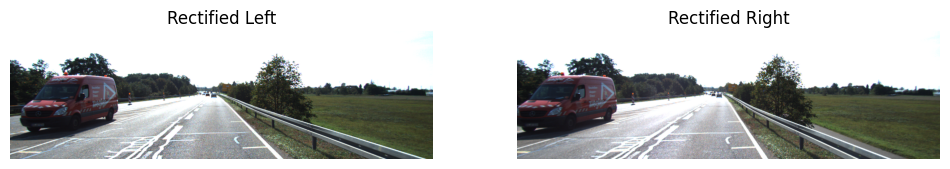

In [29]:
# Image Rectification
rectified_left, rectified_right = rectify_images(left_img_rgb, right_img_rgb, P0, P1)

print("\nStep 2: Rectification Done")

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.title("Rectified Left")
plt.imshow(rectified_left)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Rectified Right")
plt.imshow(rectified_right)
plt.axis("off")
plt.show()

Step 1: Disparity Map Computed


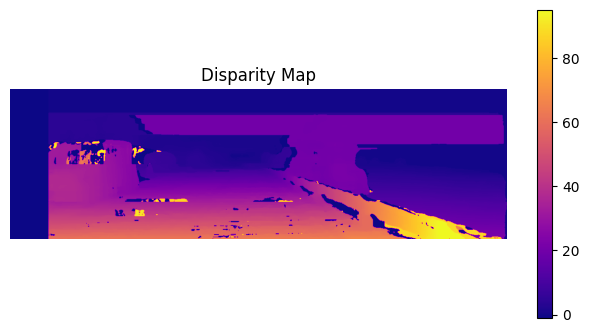

In [32]:
# Generating disparity from purely rectified images
disparity = generate_disparity_map(rectified_left, rectified_right)

print("Step 1: Disparity Map Computed")


plt.figure(figsize=(8, 4))
plt.title("Disparity Map")
plt.imshow(disparity, cmap='plasma')
plt.colorbar()
plt.axis("off")
plt.show()


Step 2: Normalized Disparity Map


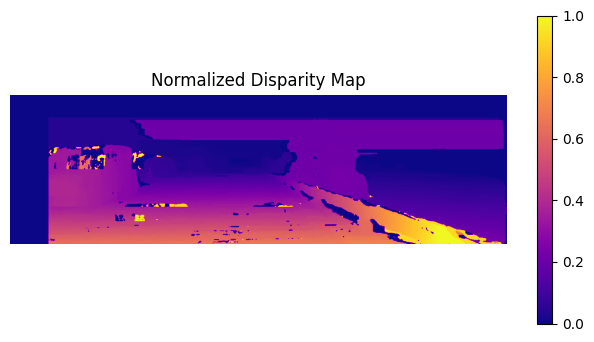

In [33]:
norm_disparity = normalize_disparity(disparity)

print("Step 2: Normalized Disparity Map")

plt.figure(figsize=(8, 4))
plt.title("Normalized Disparity Map")
plt.imshow(norm_disparity, cmap='plasma')
plt.colorbar()
plt.axis("off")
plt.show()

Step 3: Resized & Normalized Disparity Map


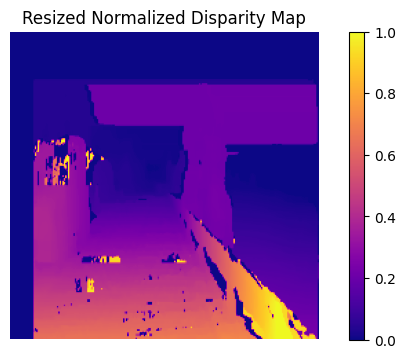

In [34]:
resized_norm_disparity = resize_image(norm_disparity, target_size=(224, 224))

# Step 4: Visualize
print("Step 3: Resized & Normalized Disparity Map")

plt.figure(figsize=(8, 4))
plt.title("Resized Normalized Disparity Map")
plt.imshow(resized_norm_disparity, cmap='plasma')
plt.colorbar()
plt.axis("off")
plt.show()

Step 2: Normalization & Resizing Done


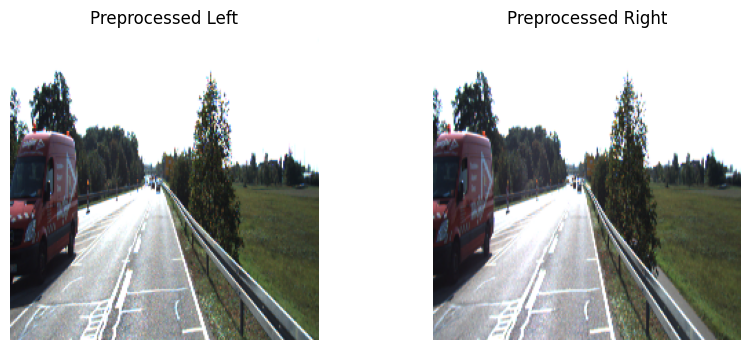

In [35]:
# NORMALIZATION AND RESIZING WITHOUT DISPARITY: ONLY FOR REFERENCE, DONT USE ANYWHERE

norm_left = preprocess_for_model(rectified_left)
norm_right = preprocess_for_model(rectified_right)

print("Step 2: Normalization & Resizing Done")

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.title("Preprocessed Left")
plt.imshow((norm_left * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]).clip(0, 1))
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Preprocessed Right")
plt.imshow((norm_right * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]).clip(0, 1))
plt.axis("off")
plt.show()

# For all images


In [36]:
import os
from tqdm import tqdm

# Create output directories
base_out = "/kaggle/working/processed"
os.makedirs(f"{base_out}/left", exist_ok=True)
os.makedirs(f"{base_out}/right", exist_ok=True)
os.makedirs(f"{base_out}/disparity", exist_ok=True)

# Set your desired model input size
target_size = (224, 224)

for i, (left_path, right_path) in enumerate(tqdm(image_pairs)):

    left_img = cv2.imread(left_path)
    right_img = cv2.imread(right_path)
    left_img_rgb = cv2.cvtColor(left_img, cv2.COLOR_BGR2RGB)
    right_img_rgb = cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB)
    
    key = valid_keys[i]
    calib = all_calibs[key]
    P0 = calib["P0"].reshape(3, 4)
    P1 = calib["P1"].reshape(3, 4)
    
    K0, R0, t0 = decompose_projection_matrix(P0)
    K1, R1, t1 = decompose_projection_matrix(P1)


    # Rectify
    rectified_left, rectified_right = rectify_images(left_img, right_img, P0, P1)

    # Disparity
    disparity = generate_disparity_map(rectified_left, rectified_right)
    norm_disp = normalize_disparity(disparity)

    # Normalize and resize images
    def prep_img(img):
        img = img.astype(np.float32) / 255.0
        return resize_image(img, target_size)

    left_final = prep_img(rectified_left)
    right_final = prep_img(rectified_right)
    disp_final = resize_image(norm_disp, target_size)

    # Save
    out_name = f"{i:04d}.npy"
    np.save(f"{base_out}/left/{out_name}", left_final)
    np.save(f"{base_out}/right/{out_name}", right_final)
    np.save(f"{base_out}/disparity/{out_name}", disp_final)

print("✅ All images preprocessed and saved!")


100%|██████████| 7481/7481 [15:55<00:00,  7.83it/s]

✅ All images preprocessed and saved!


Available left files: ['0000.npy', '0001.npy', '0002.npy', '0003.npy', '0004.npy']
Inspecting: 0003.npy
Shape: (224, 224)  Min: 0.0  Max: 1.0


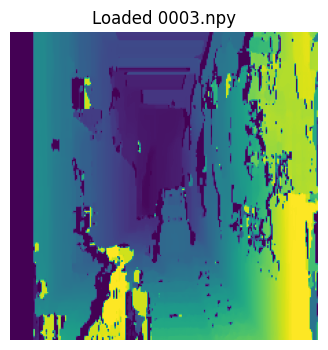

In [37]:
import os
import numpy as np
import matplotlib.pyplot as plt

# 1. Point to your processed directory
base_out = "/kaggle/working/processed"

# 2. List all saved left‐images (or right/disparity) and pick one
left_files = sorted(os.listdir(f"{base_out}/left"))
print("Available left files:", left_files[:5])

# choose the first one (or change index)
fname = left_files[3]
print("Inspecting:", fname)

# 3. Load it
arr = np.load(f"{base_out}/disparity/{fname}")   # use np.load for .npy
# if you saved as PNG, instead do:
# arr = plt.imread(f"{base_out}/left/{fname}")

# 4. Show stats
print("Shape:", arr.shape, " Min:", arr.min(), " Max:", arr.max())

# 5. Visualize
plt.figure(figsize=(4,4))
plt.imshow(arr if arr.ndim==2 else arr[...,::-1])  # RGB vs grayscale
plt.title(f"Loaded {fname}")
plt.axis("off")
plt.show()


**HYBRID 3D MODEL GENERATION**


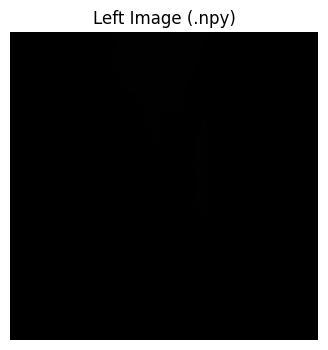

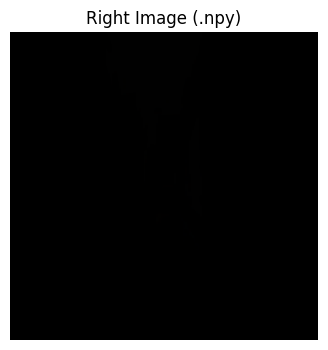

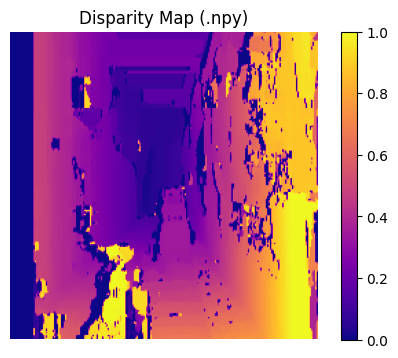

Left tensor shape: torch.Size([1, 3, 224, 224])
Right tensor shape: torch.Size([1, 3, 224, 224])
Disparity tensor shape: torch.Size([1, 1, 224, 224])


In [38]:
import numpy as np
import torch
import matplotlib.pyplot as plt

# Paths to your .npy files
left_path = "/kaggle/working/processed/left/0003.npy"
right_path = "/kaggle/working/processed/right/0003.npy"
disp_path = "/kaggle/working/processed/disparity/0003.npy"

# Load .npy arrays
left_img = np.load(left_path)
right_img = np.load(right_path)
disparity_img = np.load(disp_path)

# Visualize the left image
plt.figure(figsize=(6, 4))
plt.title("Left Image (.npy)")
plt.imshow(left_img.astype(np.uint8))   # Assuming original pixel values are 0-255
plt.axis("off")
plt.show()

# Visualize the right image
plt.figure(figsize=(6, 4))
plt.title("Right Image (.npy)")
plt.imshow(right_img.astype(np.uint8))
plt.axis("off")
plt.show()

# Visualize the disparity map
plt.figure(figsize=(6, 4))
plt.title("Disparity Map (.npy)")
plt.imshow(disparity_img, cmap='plasma')
plt.colorbar()
plt.axis("off")
plt.show()

# Normalize disparity if it's not in 0-1 range
if disparity_img.max() > 1.0:
    disparity_img = disparity_img / 255.0

# Convert to torch tensors
# Left and Right images assumed shape (H, W, 3)
left_tensor = torch.from_numpy(left_img).permute(2, 0, 1).float().unsqueeze(0) / 255.0  # Shape: (1, 3, H, W)
right_tensor = torch.from_numpy(right_img).permute(2, 0, 1).float().unsqueeze(0) / 255.0

# Disparity assumed shape (H, W)
disparity_tensor = torch.from_numpy(disparity_img).float().unsqueeze(0).unsqueeze(0)    # Shape: (1, 1, H, W)

# Print tensor shapes for confirmation
print("Left tensor shape:", left_tensor.shape)
print("Right tensor shape:", right_tensor.shape)
print("Disparity tensor shape:", disparity_tensor.shape)


In [39]:
#voxel grid
def disparity_to_voxel(disparity_tensor, grid_size=32):
    disparity_np = disparity_tensor.squeeze().numpy()
    h, w = disparity_np.shape
    voxel_grid = np.zeros((grid_size, grid_size, grid_size), dtype=np.float32)
    
    scale_h, scale_w = h / grid_size, w / grid_size

    for i in range(grid_size):
        for j in range(grid_size):
            h_idx = int(i * scale_h)
            w_idx = int(j * scale_w)
            value = disparity_np[h_idx, w_idx]
            z_idx = int(value * (grid_size - 1))
            voxel_grid[i, j, z_idx] = 1.0

    return torch.from_numpy(voxel_grid).unsqueeze(0).unsqueeze(0)  # (1, 1, D, H, W)

voxel_grid = disparity_to_voxel(disparity_tensor, grid_size=32)
print("Voxel Grid shape:", voxel_grid.shape)


Voxel Grid shape: torch.Size([1, 1, 32, 32, 32])


In [40]:
import torch.nn as nn
import torch.nn.functional as F

class Hybrid3DNet(nn.Module):
    def __init__(self):
        super(Hybrid3DNet, self).__init__()
        self.conv1 = nn.Conv3d(1, 16, 3, padding=1)
        self.conv2 = nn.Conv3d(16, 32, 3, padding=1)
        self.conv3 = nn.Conv3d(32, 1, 3, padding=1)
        
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = torch.sigmoid(self.conv3(x))
        return x

model = Hybrid3DNet()
output_grid = model(voxel_grid)
print("Output Voxel Grid shape:", output_grid.shape)


Output Voxel Grid shape: torch.Size([1, 1, 32, 32, 32])


In [41]:
from skimage import measure

output_np = output_grid.detach().numpy().squeeze()

verts, faces, normals, values = measure.marching_cubes(output_np, level=0.5)

print(f"Generated Mesh: {len(verts)} vertices, {len(faces)} faces")


Generated Mesh: 11001 vertices, 20998 faces


In [42]:
!pip install open3d

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 1.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 104.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 14.3 MB/s eta 0:00:00
  Attempting uninstall: werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3
  Attempting uninstall: flask
    Found existing installation: Flask 3.1.0
    Uninstalling Flask-3.1.0:
      Successfully uninstalled Flask-3.1.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.10.0 requires tensorflow==2.17.0, but you have tensorflow 2.17.1 which is incompatible.


In [ ]:
import os
import open3d as o3d
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# 📁 Create output directory if it doesn't exist
output_dir = "/kaggle/working/3d"
os.makedirs(output_dir, exist_ok=True)

# ✅ Create Open3D mesh object
mesh = o3d.geometry.TriangleMesh()
mesh.vertices = o3d.utility.Vector3dVector(verts)
mesh.triangles = o3d.utility.Vector3iVector(faces)

# Compute normals for better rendering quality
mesh.compute_vertex_normals()

# ✅ Save the mesh as a PLY file inside /3d directory
mesh_path = os.path.join(output_dir, "output_mesh_0003.ply")
o3d.io.write_triangle_mesh(mesh_path, mesh)

# ✅ Since Kaggle can't show interactive Open3D windows, use matplotlib to plot 3D scatter of vertices
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of the mesh vertices
scatter = ax.scatter(
    verts[:, 0], verts[:, 1], verts[:, 2],
    s=0.5,                         # marker size
    c=verts[:, 2],                 # color mapped to z-axis (depth)
    cmap='plasma'
)

# Set axis labels and plot title
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.set_title("3D Mesh Vertices Scatter Plot")

# Add a colorbar to the plot
fig.colorbar(scatter, ax=ax, shrink=0.6)

# ✅ Save the plot as a PNG image in /3d directory
plot_path = os.path.join(output_dir, "mesh_3d_plot.png")
plt.savefig(plot_path, dpi=300, bbox_inches='tight')

# Also display it inline
plt.show()

print(f"Mesh saved at: {mesh_path}")
print(f"3D plot saved at: {plot_path}")


Processing images:   0%|          | 0/15 [00:00<?, ?image/s]

Generated Mesh for 0000.npy: 11532 vertices, 21896 faces
Mesh saved at: /kaggle/working/3d/output_mesh_0001.ply
3D plot saved at: /kaggle/working/3d/mesh_3d_plot_0001.png


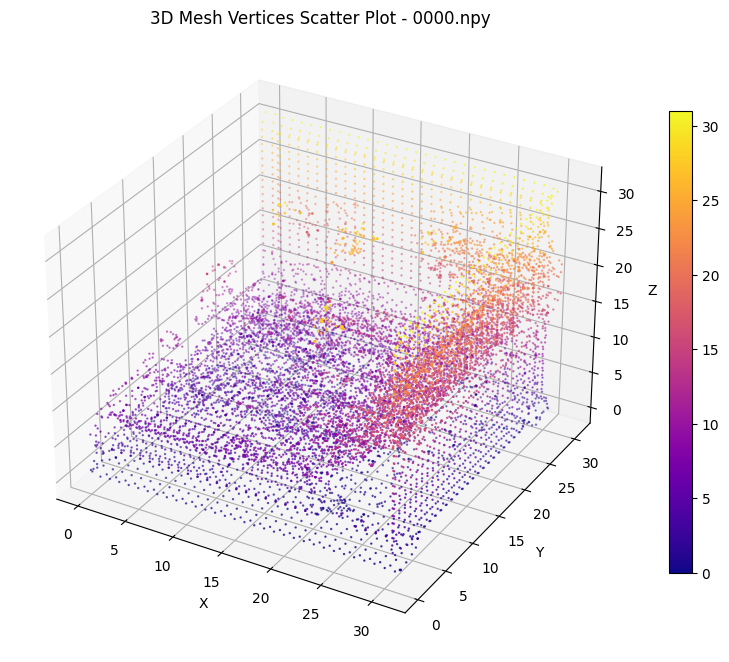

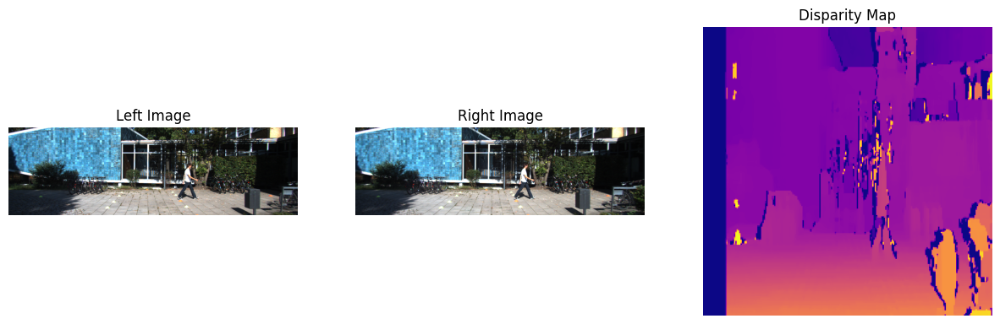

Processing images:   7%|▋         | 1/15 [00:02<00:38,  2.73s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0001.png
NeRF model output for 0000.npy: tensor([[-7.0622e-02, -2.8343e-02,  4.6131e-02,  5.2521e-02],
        [-7.9926e-02, -3.1644e-02, -1.2521e-02, -3.6901e-02],
        [-8.1452e-02, -4.3253e-02, -1.5750e-02, -1.7185e-02],
        [-7.6406e-02, -1.6749e-02,  4.7636e-02,  8.3629e-02],
        [-8.6978e-02, -8.1804e-02,  1.9235e-02,  9.3314e-02],
        [-7.0887e-02,  9.5815e-04, -1.0631e-02,  1.3425e-02],
        [-7.7961e-02,  1.8310e-02,  1.0894e-02,  5.4167e-02],
        [-8.8451e-02, -4.5334e-02,  8.9316e-03,  7.7803e-02],
        [-1.0104e-01, -7.9893e-02, -3.8492e-03,  3.7479e-02],
        [-9.1812e-02, -5.2864e-02,  7.5536e-05,  2.3158e-02],
        [-6.7216e-02,  1.8570e-03,  5.6565e-02,  7.4324e-02],
        [-9.4099e-02, -4.8505e-02,  2.5860e-02,  5.5745e-02],
        [-9.5766e-02, -6.3021e-02,  7.9796e-03,  3.0666e-02],
        [-6.8824e-02, -1.9552e-02, -3.3347e-02,  1.3751e-02],
        [-8.1405e-02, -4.7046e-02, 

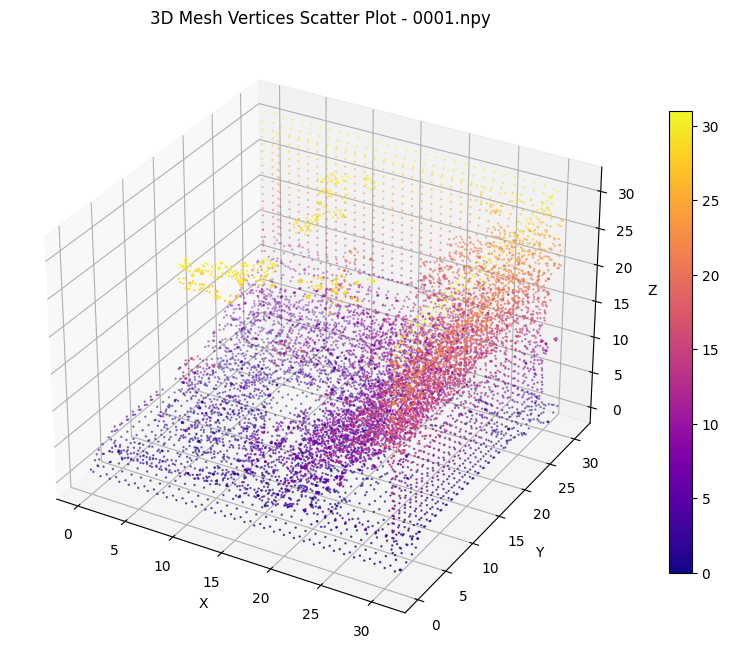

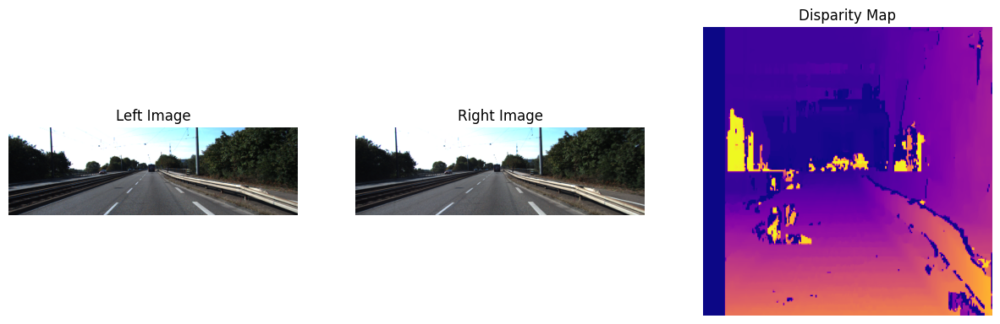

Processing images:  13%|█▎        | 2/15 [00:05<00:34,  2.63s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0002.png
NeRF model output for 0001.npy: tensor([[-0.0784,  0.0037,  0.0115,  0.0721],
        [-0.0663, -0.0387,  0.0165,  0.0048],
        [-0.0858, -0.0388,  0.0194,  0.0256],
        [-0.0725, -0.0076, -0.0045, -0.0185],
        [-0.0703, -0.0071,  0.0289,  0.0151],
        [-0.0994, -0.0779,  0.0030,  0.0402],
        [-0.0762,  0.0134,  0.0503,  0.0602],
        [-0.0705, -0.0236, -0.0186, -0.0236],
        [-0.0809, -0.0128,  0.0421,  0.0787],
        [-0.0789, -0.0351,  0.0400,  0.0476],
        [-0.0673,  0.0161,  0.0223, -0.0070],
        [-0.0702, -0.0363,  0.0440,  0.0450],
        [-0.0785, -0.0255,  0.0438,  0.0860],
        [-0.0534,  0.0561,  0.0243, -0.0150],
        [-0.0821, -0.0708,  0.0378,  0.0731],
        [-0.0718,  0.0076,  0.0486,  0.0523],
        [-0.0739, -0.0266, -0.0077, -0.0532],
        [-0.0826, -0.0166,  0.0161,  0.0134],
        [-0.0659,  0.0109,  0.0152, -0.0208],
        [-0.0716, -0.0280,  0

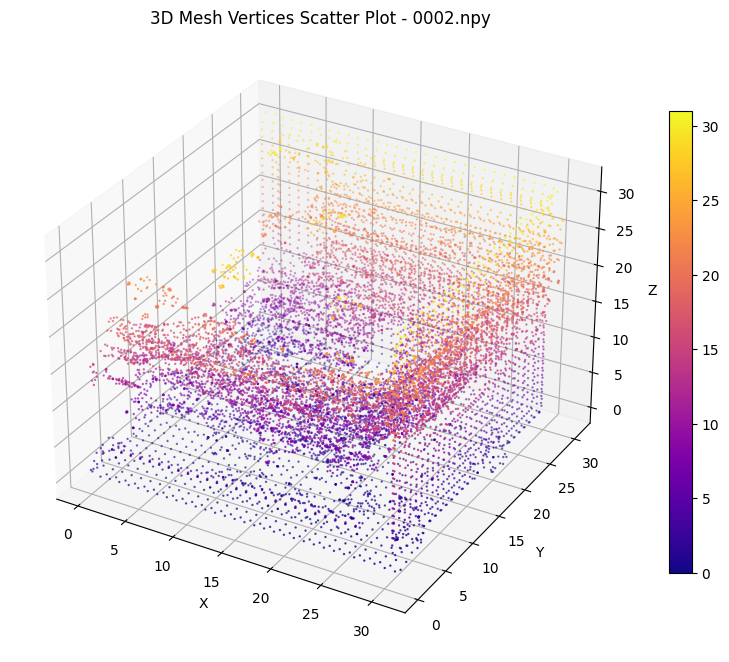

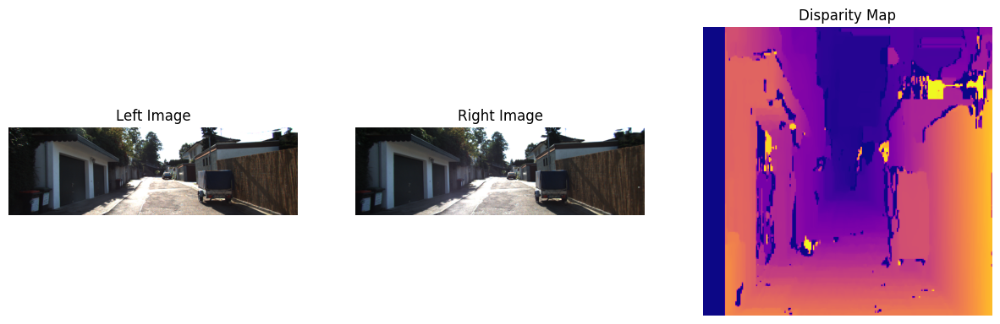

Processing images:  20%|██        | 3/15 [00:07<00:31,  2.65s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0003.png
NeRF model output for 0002.npy: tensor([[-8.5089e-02, -2.1806e-02,  2.6500e-02,  2.7790e-02],
        [-7.1275e-02, -7.7987e-03,  4.4969e-02,  4.8329e-02],
        [-8.8548e-02, -2.8478e-02,  9.1009e-03,  3.7467e-02],
        [-8.4230e-02,  7.7093e-03,  3.9415e-02,  7.3527e-02],
        [-7.9245e-02, -1.5053e-02,  6.5190e-05,  7.5649e-02],
        [-8.7342e-02, -8.4859e-02,  2.0156e-02,  9.3419e-02],
        [-7.4680e-02, -4.0483e-02,  4.5141e-02,  6.0310e-02],
        [-9.7938e-02, -6.9236e-02,  5.0262e-03,  5.0867e-02],
        [-8.0008e-02, -6.3669e-03,  1.6297e-02,  1.3696e-02],
        [-8.3254e-02, -2.2896e-02, -9.0574e-04,  3.5041e-02],
        [-7.4272e-02, -2.0410e-02,  4.7595e-02,  9.3519e-02],
        [-9.0227e-02, -3.6044e-02,  1.3514e-02,  6.4761e-02],
        [-8.0032e-02, -2.8058e-02,  2.1111e-02,  1.5900e-02],
        [-7.2097e-02,  4.1969e-03, -6.1647e-03,  1.5046e-02],
        [-8.1651e-02, -1.8689e-02, 

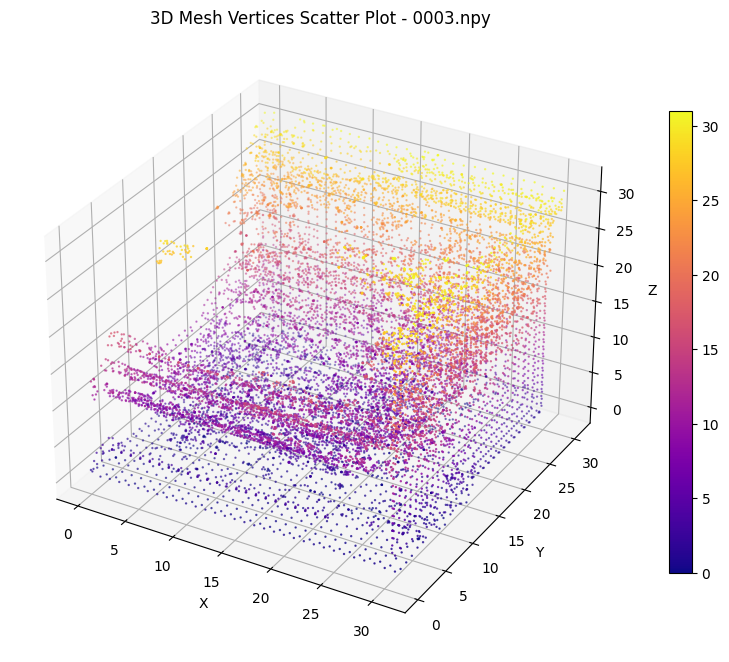

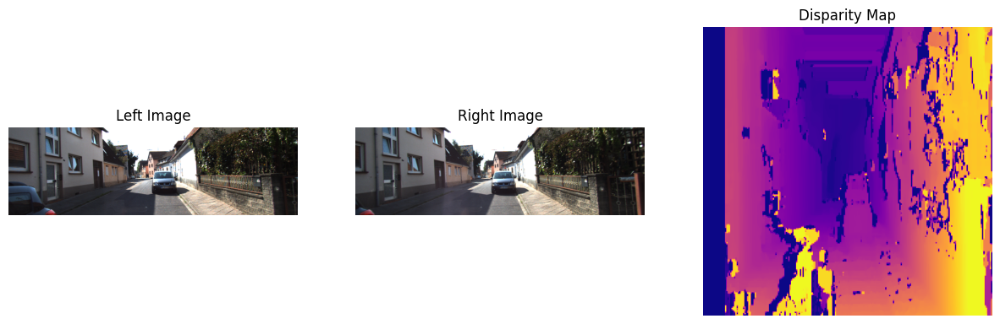

Processing images:  27%|██▋       | 4/15 [00:10<00:29,  2.70s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0004.png
NeRF model output for 0003.npy: tensor([[-7.0033e-02, -5.7080e-03,  1.9805e-02,  2.4855e-05],
        [-9.1676e-02, -7.2108e-02, -1.3449e-02,  4.6214e-02],
        [-8.9249e-02, -2.0755e-02,  3.0301e-02,  6.4102e-02],
        [-8.1691e-02,  6.4375e-04,  3.1941e-02,  3.0543e-02],
        [-7.1051e-02, -3.1084e-02,  2.4408e-02,  1.4683e-02],
        [-7.0299e-02, -1.5429e-03, -5.1074e-03, -2.6056e-02],
        [-7.6998e-02, -7.4346e-02,  4.3737e-02,  8.7891e-02],
        [-6.7988e-02, -2.3884e-02,  2.9042e-02,  1.5862e-02],
        [-7.4902e-02, -2.8527e-02, -1.4704e-02, -5.5062e-02],
        [-7.1981e-02, -9.7477e-03,  7.7917e-03,  1.0383e-01],
        [-6.1410e-02,  3.7208e-02,  3.2781e-02,  8.0105e-03],
        [-8.0060e-02, -3.7568e-02, -1.3060e-02, -1.5084e-02],
        [-1.0370e-01, -1.0815e-01,  1.5441e-03,  7.2632e-02],
        [-7.4335e-02, -1.5137e-02, -2.1760e-03, -2.9821e-02],
        [-9.8031e-02, -7.9670e-02, 

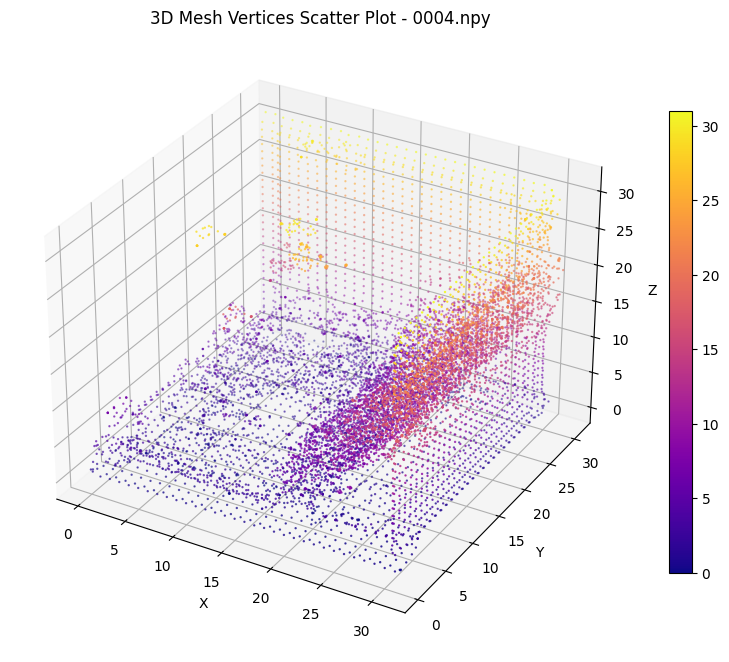

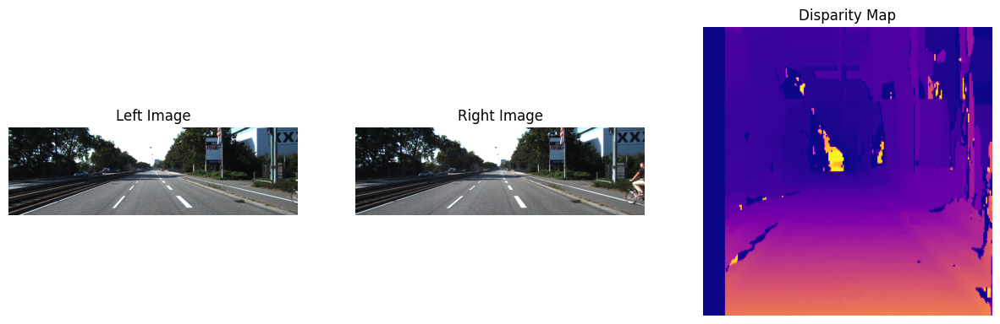

Processing images:  33%|███▎      | 5/15 [00:13<00:27,  2.73s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0005.png
NeRF model output for 0004.npy: tensor([[-0.1043, -0.0926,  0.0023,  0.0525],
        [-0.0823, -0.0084,  0.0420,  0.0532],
        [-0.0834, -0.0490,  0.0386,  0.0606],
        [-0.0721,  0.0331,  0.0419,  0.0521],
        [-0.0769, -0.0736,  0.0450,  0.0781],
        [-0.0931, -0.0685,  0.0192,  0.0702],
        [-0.0704, -0.0310,  0.0516,  0.0965],
        [-0.0784, -0.0308, -0.0106, -0.0157],
        [-0.0572,  0.0431,  0.0309, -0.0020],
        [-0.0882, -0.0575,  0.0060,  0.0805],
        [-0.0731, -0.0575,  0.0420,  0.1017],
        [-0.0896, -0.0442,  0.0295,  0.0501],
        [-0.0731, -0.0192,  0.0276,  0.0138],
        [-0.0712,  0.0124,  0.0246,  0.0024],
        [-0.0863, -0.0298,  0.0068,  0.0732],
        [-0.0656,  0.0181, -0.0101,  0.0655],
        [-0.0621,  0.0050,  0.0011, -0.0501],
        [-0.0808,  0.0069,  0.0089,  0.0421],
        [-0.0754, -0.0092,  0.0108, -0.0093],
        [-0.0822, -0.0175,  0

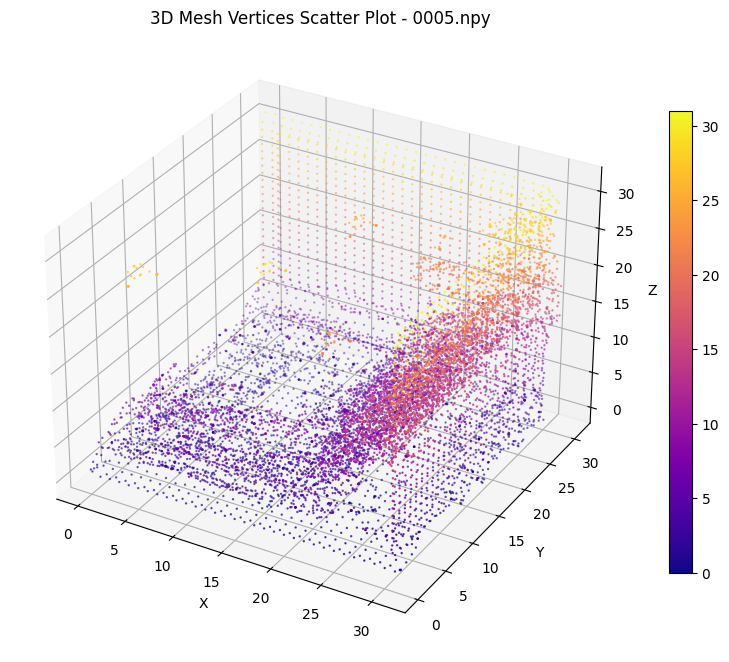

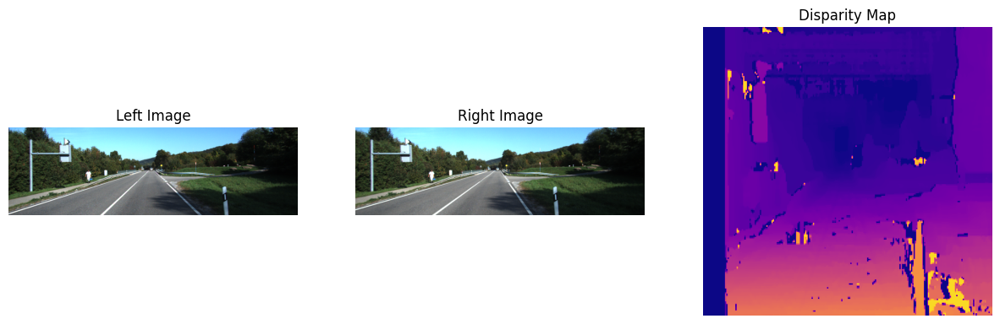

Processing images:  40%|████      | 6/15 [00:16<00:24,  2.69s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0006.png
NeRF model output for 0005.npy: tensor([[-0.0955, -0.0554,  0.0204,  0.0598],
        [-0.0932, -0.0694,  0.0155,  0.0451],
        [-0.0794, -0.0354,  0.0307,  0.0980],
        [-0.0959, -0.0998,  0.0142,  0.0782],
        [-0.0700, -0.0034,  0.0090, -0.0202],
        [-0.0569,  0.0311,  0.0247, -0.0206],
        [-0.0707, -0.0205,  0.0262,  0.0116],
        [-0.0643,  0.0036,  0.0195, -0.0051],
        [-0.0951, -0.0721,  0.0162,  0.0639],
        [-0.0814, -0.0121,  0.0431,  0.0551],
        [-0.1057, -0.0931,  0.0005,  0.0506],
        [-0.0853, -0.0443,  0.0133,  0.0192],
        [-0.0780, -0.0052,  0.0015,  0.0542],
        [-0.0828, -0.0073,  0.0430,  0.0574],
        [-0.0697,  0.0096,  0.0319,  0.0109],
        [-0.0822, -0.0316,  0.0241,  0.0927],
        [-0.0997, -0.0922,  0.0074,  0.0666],
        [-0.0645,  0.0313,  0.0472,  0.0411],
        [-0.0721, -0.0071, -0.0133,  0.0298],
        [-0.0852,  0.0057,  0

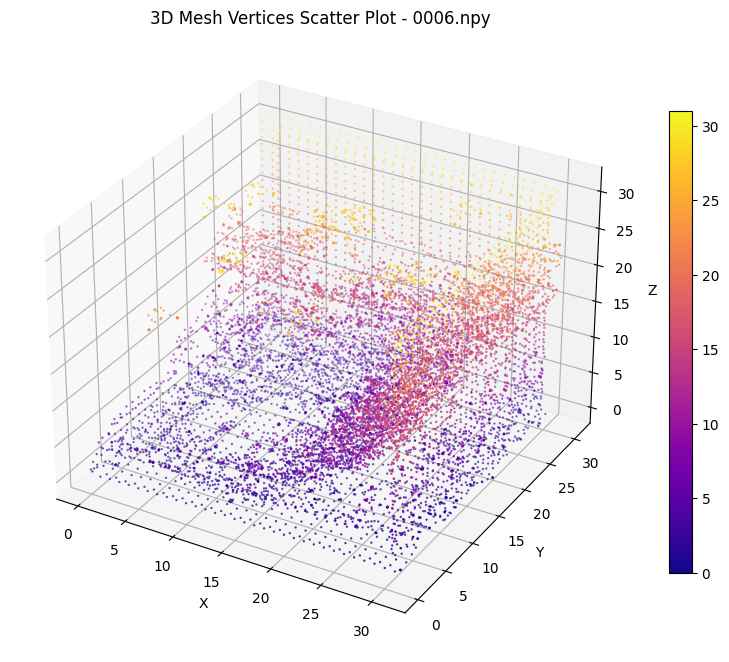

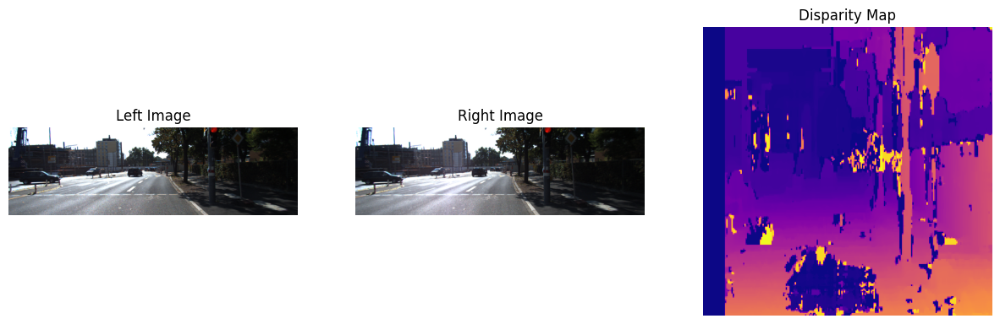

Processing images:  47%|████▋     | 7/15 [00:18<00:21,  2.67s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0007.png
NeRF model output for 0006.npy: tensor([[-0.0574,  0.0276,  0.0377,  0.0119],
        [-0.0748, -0.0219, -0.0136, -0.0052],
        [-0.0772, -0.0348,  0.0184,  0.0123],
        [-0.0802, -0.0159,  0.0029,  0.0147],
        [-0.0999, -0.0724, -0.0078,  0.0305],
        [-0.0804,  0.0064,  0.0486,  0.0720],
        [-0.0889, -0.0561,  0.0290,  0.0794],
        [-0.0785, -0.0441,  0.0401,  0.0918],
        [-0.0834, -0.0332, -0.0049,  0.0073],
        [-0.0788, -0.0730,  0.0405,  0.0665],
        [-0.0847, -0.0344,  0.0036,  0.0097],
        [-0.0606, -0.0009,  0.0033, -0.0601],
        [-0.0757, -0.0019,  0.0330,  0.0222],
        [-0.0742, -0.0172, -0.0111,  0.0574],
        [-0.0797, -0.0273, -0.0027, -0.0110],
        [-0.0981, -0.0982,  0.0047,  0.0766],
        [-0.0892, -0.0925,  0.0297,  0.0715],
        [-0.0821, -0.0455,  0.0276,  0.0940],
        [-0.0871, -0.0916,  0.0332,  0.0749],
        [-0.0937, -0.0550,  0

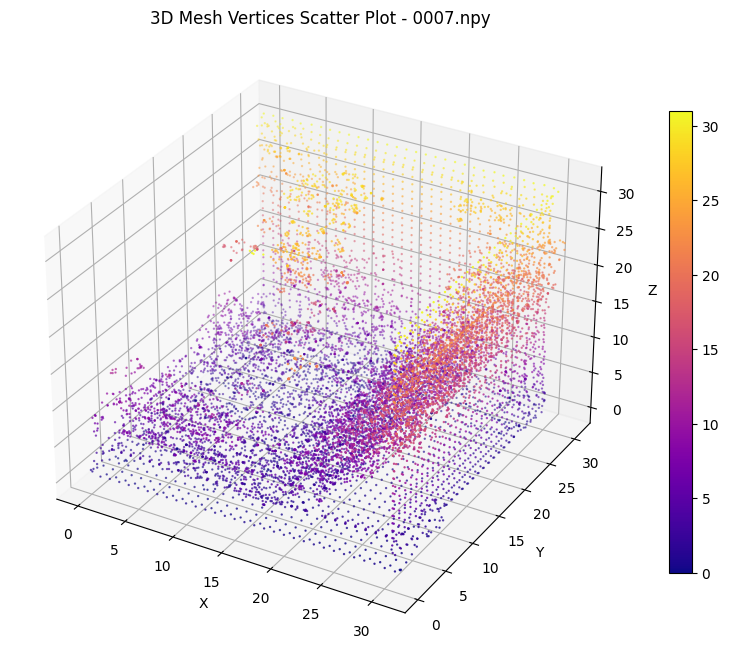

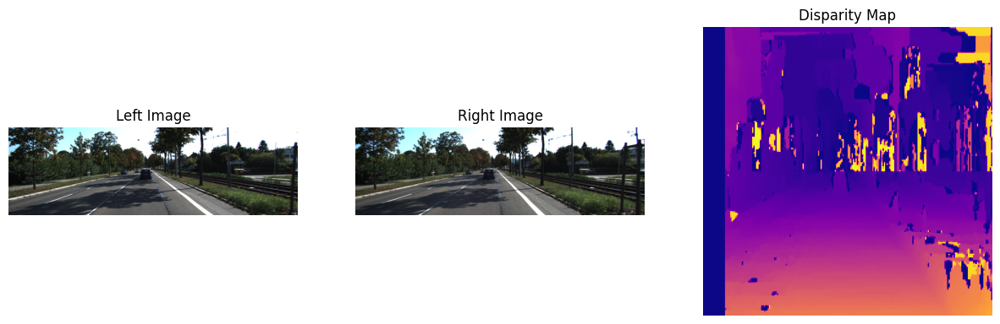

Processing images:  53%|█████▎    | 8/15 [00:21<00:18,  2.68s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0008.png
NeRF model output for 0007.npy: tensor([[-0.0711, -0.0210,  0.0032, -0.0353],
        [-0.0725, -0.0099, -0.0147,  0.0253],
        [-0.0801, -0.0694,  0.0266,  0.0422],
        [-0.0920, -0.0734,  0.0140,  0.0762],
        [-0.0835, -0.0388,  0.0147,  0.0911],
        [-0.0625, -0.0406,  0.0263,  0.0205],
        [-0.0769,  0.0143,  0.0515,  0.0786],
        [-0.0675, -0.0098,  0.0143, -0.0138],
        [-0.0799, -0.0180,  0.0074,  0.0008],
        [-0.0873, -0.0439, -0.0092,  0.0157],
        [-0.0936, -0.0518, -0.0010,  0.0402],
        [-0.0812, -0.0489,  0.0373,  0.0888],
        [-0.0778, -0.0168,  0.0018, -0.0068],
        [-0.0737, -0.0026,  0.0059, -0.0146],
        [-0.0711,  0.0211, -0.0036,  0.0443],
        [-0.0863, -0.0264,  0.0380,  0.0554],
        [-0.0757, -0.0459,  0.0478,  0.0817],
        [-0.0926, -0.0408,  0.0201,  0.0355],
        [-0.0741,  0.0040,  0.0031, -0.0095],
        [-0.0709,  0.0186,  0

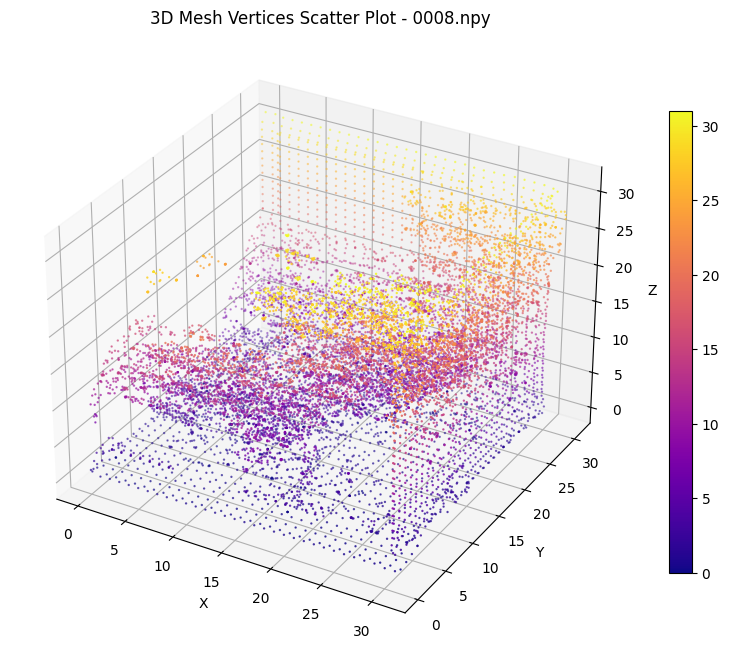

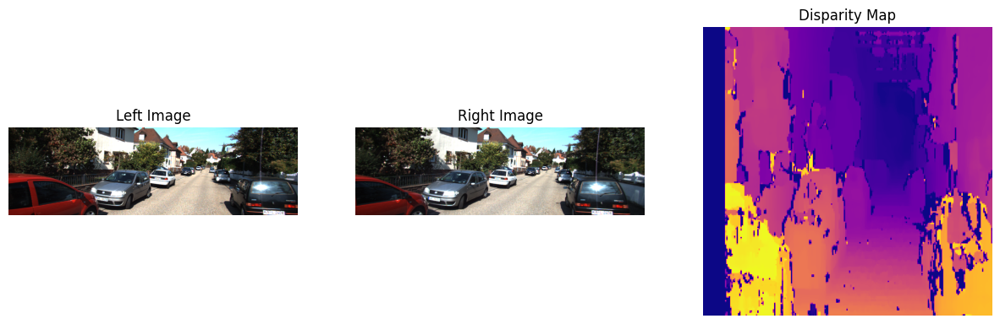

Processing images:  60%|██████    | 9/15 [00:24<00:16,  2.69s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0009.png
NeRF model output for 0008.npy: tensor([[-8.0574e-02, -4.9915e-02, -3.2432e-02,  3.6458e-03],
        [-7.9204e-02, -2.6328e-02, -8.5737e-03, -2.9387e-02],
        [-7.9572e-02, -2.7185e-02,  3.9526e-02,  8.8780e-02],
        [-7.1665e-02, -2.0375e-02, -1.6415e-02, -4.5248e-02],
        [-6.9270e-02,  3.4971e-02,  1.5753e-02,  1.7786e-02],
        [-7.1959e-02, -2.4380e-03, -4.1293e-03, -1.0595e-02],
        [-9.5607e-02, -1.0257e-01,  2.0013e-02,  5.9279e-02],
        [-7.0280e-02,  2.4483e-02,  4.4349e-02,  3.2911e-02],
        [-6.4938e-02,  1.3101e-02,  2.5579e-02, -5.8433e-03],
        [-7.3274e-02, -2.7961e-02,  5.6653e-03, -2.3334e-02],
        [-6.5092e-02,  2.5720e-02, -9.5908e-03,  5.3819e-02],
        [-7.1210e-02, -1.0819e-03, -1.0549e-02,  1.1415e-02],
        [-9.7670e-02, -6.7526e-02, -9.1930e-03,  2.6703e-02],
        [-7.0996e-02, -1.0782e-04,  9.1916e-03, -1.8205e-02],
        [-4.7711e-02,  5.2218e-02, 

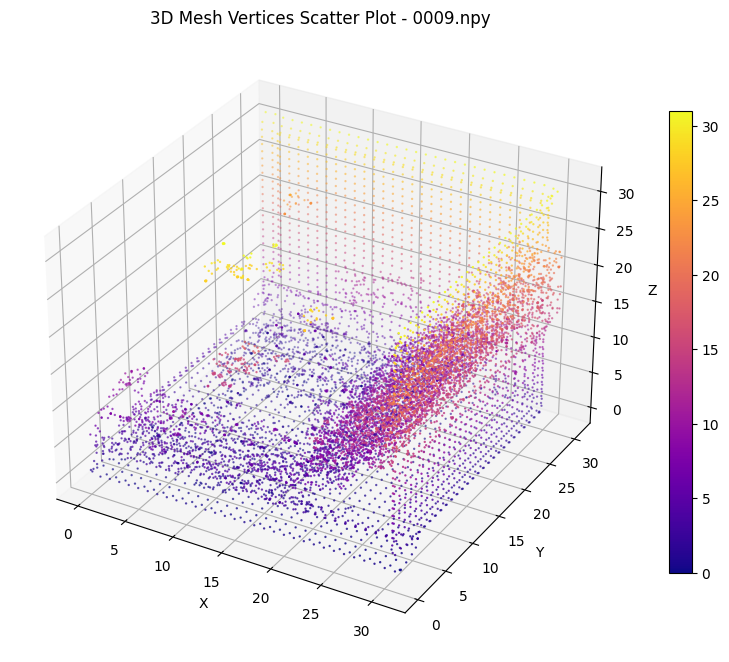

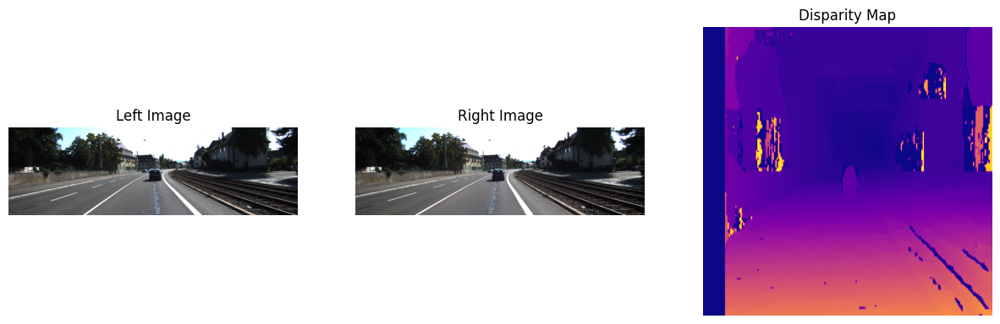

Processing images:  67%|██████▋   | 10/15 [00:26<00:13,  2.64s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0010.png
NeRF model output for 0009.npy: tensor([[-0.1004, -0.0769, -0.0022,  0.0387],
        [-0.0657, -0.0136,  0.0187, -0.0008],
        [-0.0949, -0.0858,  0.0134,  0.0517],
        [-0.0862, -0.0234,  0.0190,  0.0196],
        [-0.0968, -0.0572,  0.0125,  0.0465],
        [-0.0745,  0.0099,  0.0258,  0.0106],
        [-0.0738,  0.0083,  0.0309,  0.0133],
        [-0.0872, -0.0443, -0.0067,  0.0094],
        [-0.0877, -0.0244,  0.0198,  0.0290],
        [-0.0782, -0.0328,  0.0393,  0.0934],
        [-0.0859, -0.0649,  0.0228,  0.0423],
        [-0.0924, -0.0999,  0.0244,  0.0677],
        [-0.0645,  0.0113,  0.0408,  0.0392],
        [-0.0899, -0.0214,  0.0302,  0.0514],
        [-0.0831, -0.0028,  0.0370,  0.0432],
        [-0.0828, -0.0196,  0.0380,  0.0464],
        [-0.0772,  0.0182,  0.0175,  0.0338],
        [-0.0589,  0.0507,  0.0267,  0.0104],
        [-0.0811, -0.0266,  0.0348,  0.0893],
        [-0.0515,  0.0409,  0

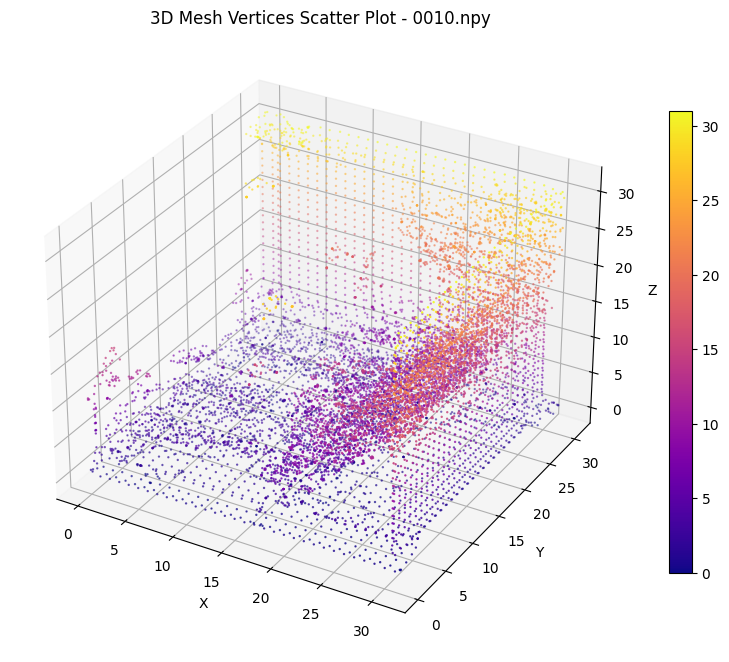

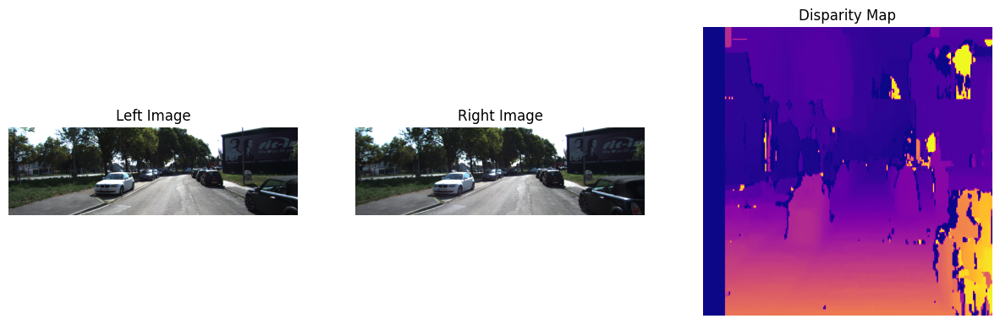

Processing images:  73%|███████▎  | 11/15 [00:29<00:10,  2.67s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0011.png
NeRF model output for 0010.npy: tensor([[-0.0727, -0.0324, -0.0360,  0.0097],
        [-0.0757, -0.0744,  0.0230,  0.0378],
        [-0.0795, -0.0766,  0.0362,  0.0977],
        [-0.0566,  0.0267,  0.0189, -0.0340],
        [-0.0722, -0.0245, -0.0062, -0.0533],
        [-0.0687, -0.0239,  0.0491,  0.0604],
        [-0.0902, -0.0509, -0.0100,  0.0170],
        [-0.0697, -0.0344,  0.0493,  0.1057],
        [-0.0805, -0.0769,  0.0376,  0.0618],
        [-0.0719,  0.0184,  0.0046, -0.0072],
        [-0.0753, -0.0735,  0.0362,  0.1111],
        [-0.0763, -0.0121,  0.0022, -0.0115],
        [-0.0797, -0.0330, -0.0137, -0.0438],
        [-0.0802, -0.0334, -0.0116, -0.0007],
        [-0.0808, -0.0334,  0.0177,  0.0962],
        [-0.0886, -0.0379,  0.0316,  0.0763],
        [-0.0719, -0.0056, -0.0045, -0.0195],
        [-0.0808, -0.0851,  0.0402,  0.0706],
        [-0.0825, -0.0493, -0.0232,  0.0062],
        [-0.1061, -0.0990, -0

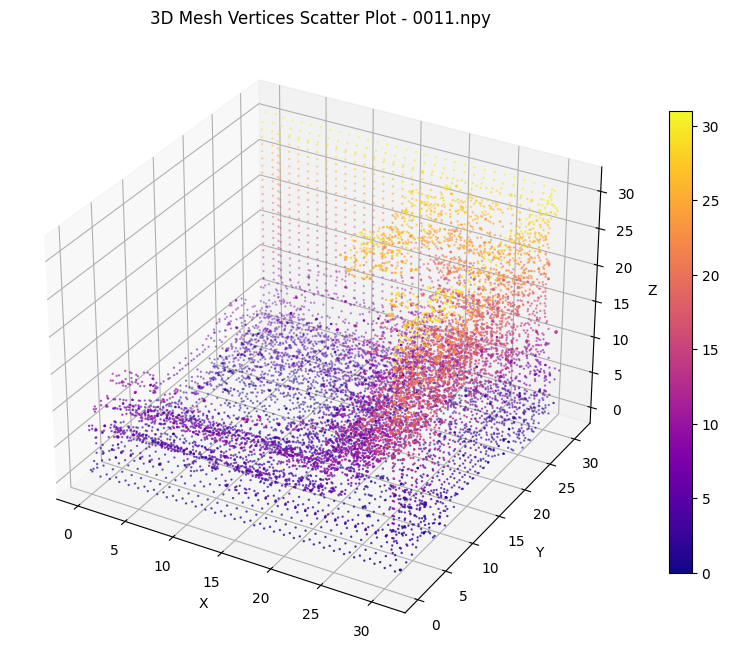

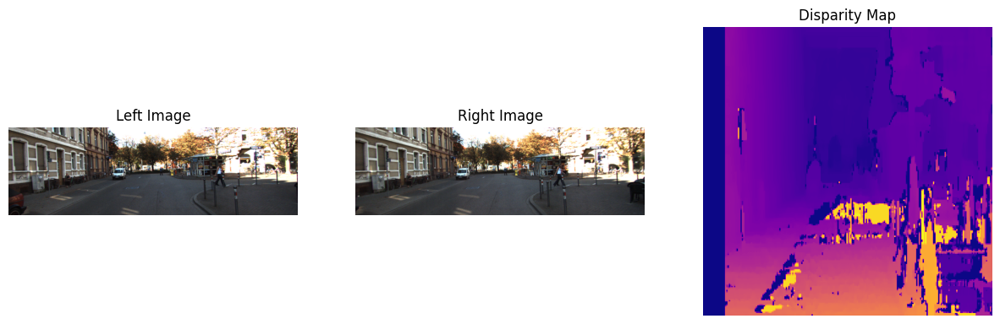

Processing images:  80%|████████  | 12/15 [00:32<00:08,  2.67s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0012.png
NeRF model output for 0011.npy: tensor([[-0.0693, -0.0257,  0.0384,  0.1075],
        [-0.0840,  0.0029,  0.0357,  0.0472],
        [-0.0584,  0.0334,  0.0240, -0.0197],
        [-0.0674,  0.0419,  0.0156,  0.0255],
        [-0.0758, -0.0449, -0.0413,  0.0007],
        [-0.0961, -0.0654,  0.0109,  0.0399],
        [-0.0804, -0.0340, -0.0120,  0.0006],
        [-0.0709, -0.0007,  0.0458,  0.0511],
        [-0.1003, -0.0844, -0.0078,  0.0576],
        [-0.0883, -0.0266,  0.0237,  0.0295],
        [-0.0730, -0.0338,  0.0468,  0.0624],
        [-0.1031, -0.0928,  0.0035,  0.0517],
        [-0.0922, -0.0460,  0.0002,  0.0365],
        [-0.0852, -0.0494, -0.0149, -0.0066],
        [-0.0793, -0.0826,  0.0389,  0.0616],
        [-0.0754,  0.0078,  0.0283,  0.0141],
        [-0.0774, -0.0093,  0.0233,  0.0084],
        [-0.0752,  0.0072,  0.0194,  0.0054],
        [-0.0810, -0.0897,  0.0394,  0.0677],
        [-0.0770, -0.0209, -0

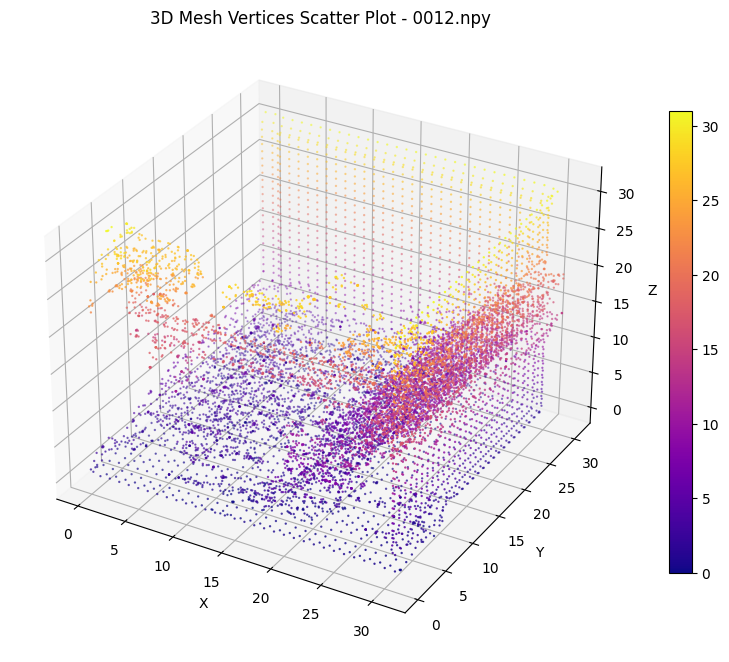

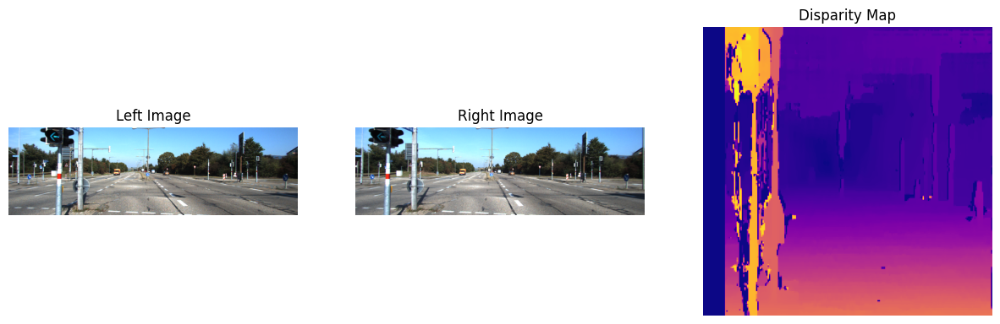

Processing images:  87%|████████▋ | 13/15 [00:34<00:05,  2.65s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0013.png
NeRF model output for 0012.npy: tensor([[-7.3321e-02, -2.4898e-02,  1.5778e-02, -4.9636e-04],
        [-8.0784e-02, -1.8037e-03,  2.1179e-02,  2.7064e-02],
        [-9.1672e-02, -7.0438e-02,  1.6325e-02,  7.5780e-02],
        [-8.1787e-02, -2.4350e-02,  4.9410e-03,  8.7217e-02],
        [-7.8969e-02,  1.8463e-02,  4.2671e-02,  5.9505e-02],
        [-6.1738e-02,  6.0819e-03,  1.5550e-02, -2.8417e-02],
        [-8.0537e-02,  1.4461e-03,  4.6932e-02,  5.8308e-02],
        [-7.9863e-02,  8.5563e-03,  1.0999e-02,  3.1627e-02],
        [-6.9923e-02, -3.0690e-04, -4.4381e-03, -2.7634e-02],
        [-7.8706e-02, -7.7328e-03,  2.8057e-02,  1.8270e-02],
        [-5.9416e-02,  3.6573e-02,  2.4371e-02, -1.4149e-02],
        [-8.7184e-02, -3.4722e-02,  9.3760e-05,  2.1272e-02],
        [-7.0915e-02, -1.2695e-02,  9.9772e-03, -2.1271e-02],
        [-7.0975e-02,  2.6667e-02,  1.5096e-02,  6.8646e-03],
        [-8.0855e-02,  1.8601e-02, 

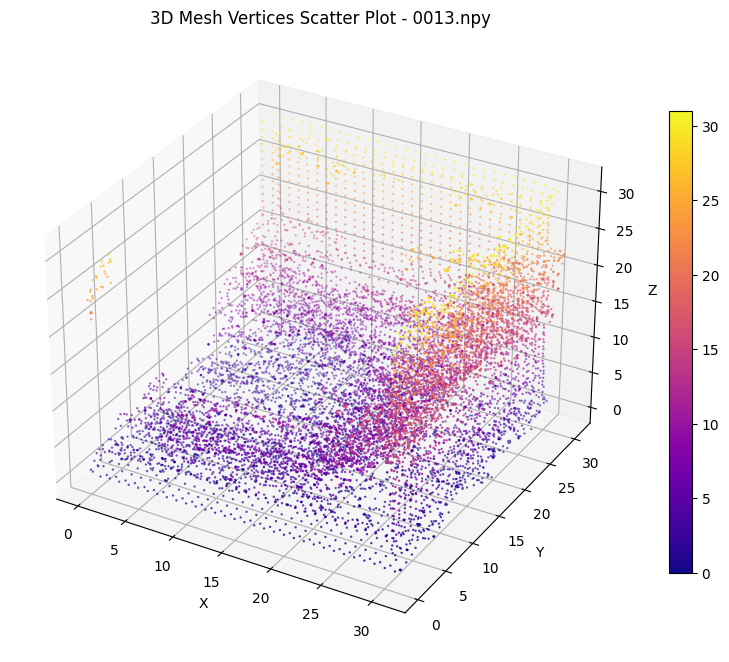

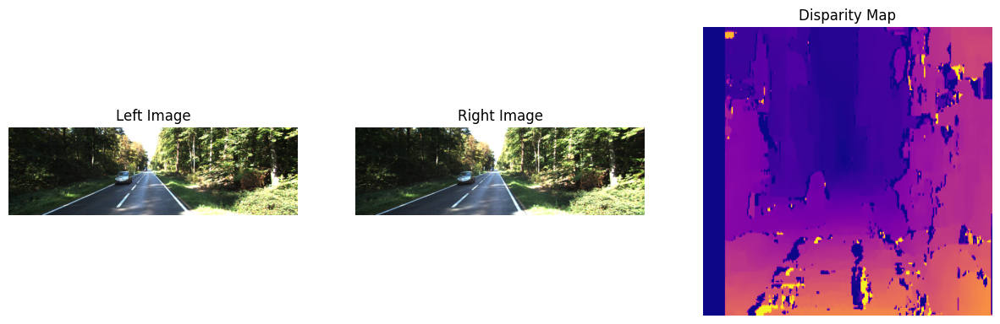

Processing images:  93%|█████████▎| 14/15 [00:37<00:02,  2.66s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0014.png
NeRF model output for 0013.npy: tensor([[-8.8058e-02, -6.0487e-02,  2.5439e-02,  4.7374e-02],
        [-9.5615e-02, -5.4404e-02,  7.4386e-03,  4.9982e-02],
        [-9.3642e-02, -4.9838e-02, -3.1263e-04,  3.4768e-02],
        [-8.6650e-02, -1.9935e-02,  2.1667e-02,  3.0764e-02],
        [-7.0101e-02,  7.2652e-03,  5.4816e-02,  6.6074e-02],
        [-7.9345e-02,  5.8228e-03,  3.8902e-02,  3.5586e-02],
        [-6.2744e-02,  2.9876e-02,  4.3421e-02,  2.9214e-02],
        [-8.9334e-02, -4.3840e-02, -1.4505e-03, -5.0076e-03],
        [-9.6934e-02, -1.2271e-01,  2.4479e-02,  7.7860e-02],
        [-8.3757e-02, -1.7267e-03,  1.8879e-02,  4.2265e-02],
        [-7.0243e-02, -2.0988e-02, -1.7566e-02, -2.4240e-02],
        [-6.3372e-02,  2.2832e-02,  4.1290e-02,  4.0877e-02],
        [-7.4043e-02, -1.3180e-02,  5.8085e-03, -1.7091e-02],
        [-8.1768e-02, -3.4361e-02,  5.8686e-03,  9.1544e-02],
        [-8.7759e-02, -4.0619e-02, 

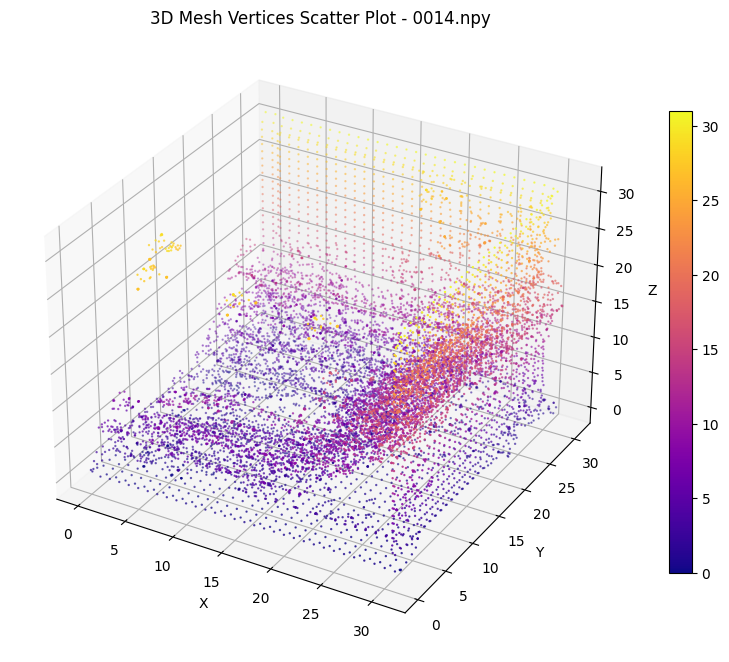

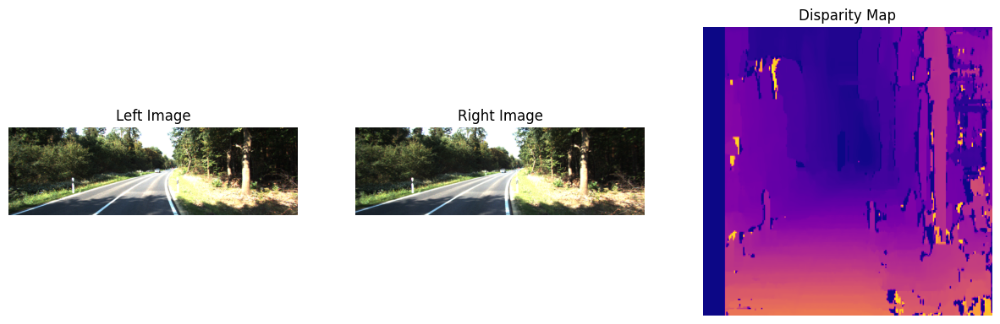

Processing images: 100%|██████████| 15/15 [00:40<00:00,  2.67s/image]

Comparison plot saved at: /kaggle/working/3d/comparison_0015.png
NeRF model output for 0014.npy: tensor([[-5.8010e-02,  3.7175e-02,  4.1817e-02,  2.2642e-02],
        [-8.5669e-02, -1.5954e-02,  2.3666e-02,  2.3842e-02],
        [-6.1488e-02,  1.6155e-02,  2.3245e-02, -1.3698e-02],
        [-6.7326e-02,  4.5153e-03,  2.3372e-02,  1.1746e-03],
        [-6.1089e-02,  1.1990e-02,  2.7195e-02,  2.7548e-03],
        [-7.5327e-02,  9.2781e-03,  1.0248e-02,  8.3114e-02],
        [-8.7040e-02, -8.4483e-02,  3.2276e-02,  7.7392e-02],
        [-5.1394e-02,  4.9161e-02,  3.5964e-02,  2.9901e-03],
        [-6.5137e-02,  1.6084e-02,  1.4268e-03, -3.5812e-02],
        [-7.1367e-02,  8.0203e-03, -7.7192e-03,  3.1784e-02],
        [-1.0168e-01, -9.7296e-02,  8.2569e-03,  6.3947e-02],
        [-9.0575e-02, -4.3533e-02,  6.0775e-03,  2.5206e-02],
        [-6.9730e-02,  1.2165e-03,  4.3100e-02,  4.4486e-02],
        [-9.1962e-02, -7.3828e-02,  3.9042e-03,  7.4587e-02],
        [-8.8201e-02, -3.2996e-02, 

In [45]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from skimage import measure
import open3d as o3d
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F

# Function to convert disparity to voxel grid
def disparity_to_voxel(disparity_tensor, grid_size=32):
    disparity_np = disparity_tensor.squeeze().numpy()
    h, w = disparity_np.shape
    voxel_grid = np.zeros((grid_size, grid_size, grid_size), dtype=np.float32)
    
    scale_h, scale_w = h / grid_size, w / grid_size

    for i in range(grid_size):
        for j in range(grid_size):
            h_idx = int(i * scale_h)
            w_idx = int(j * scale_w)
            value = disparity_np[h_idx, w_idx]
            z_idx = int(value * (grid_size - 1))
            voxel_grid[i, j, z_idx] = 1.0

    return torch.from_numpy(voxel_grid).unsqueeze(0).unsqueeze(0)  # (1, 1, D, H, W)

# Define the model
class Hybrid3DNet(nn.Module):
    def __init__(self):
        super(Hybrid3DNet, self).__init__()
        self.conv1 = nn.Conv3d(1, 16, 3, padding=1)
        self.conv2 = nn.Conv3d(16, 32, 3, padding=1)
        self.conv3 = nn.Conv3d(32, 1, 3, padding=1)
        
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = torch.sigmoid(self.conv3(x))
        return x

# Define NeRF (Neural Radiance Fields) component
class NeRF(nn.Module):
    def __init__(self, input_dim=3, output_dim=4):
        super(NeRF, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 128)
        self.fc3 = nn.Linear(128, output_dim)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

    def render(self, rays):
        return self.forward(rays)

# Output directory for saving meshes and plots
output_dir = "/kaggle/working/3d"
os.makedirs(output_dir, exist_ok=True)

# Example directories
disparity_dir = "/kaggle/working/processed/disparity"
image_dir_left = "/kaggle/input/kitti-dataset/data_object_image_2/training/image_2"
image_dir_right = "/kaggle/input/kitti-dataset/data_object_image_3/training/image_3"

# Load disparity files and process them
disparity_files = sorted(os.listdir(disparity_dir))[:15]  # First 15 disparity maps
model = Hybrid3DNet()

# Initialize NeRF model
nerf_model = NeRF()

# Process 15 images
for idx, disparity_file in enumerate(tqdm(disparity_files, desc="Processing images", unit="image")):
    # Load disparity map (assume it's saved as a numpy array .npy)
    disparity_path = os.path.join(disparity_dir, disparity_file)
    disparity = np.load(disparity_path)

    # Convert disparity to voxel grid
    disparity_tensor = torch.from_numpy(disparity).unsqueeze(0).unsqueeze(0).float()
    voxel_grid = disparity_to_voxel(disparity_tensor, grid_size=32)

    # Pass the voxel grid through the CNN
    output_grid = model(voxel_grid)
    output_np = output_grid.detach().numpy().squeeze()

    # Generate mesh using marching cubes
    verts, faces, _, _ = measure.marching_cubes(output_np, level=0.5)
    print(f"Generated Mesh for {disparity_file}: {len(verts)} vertices, {len(faces)} faces")

    # Create Open3D mesh object
    mesh = o3d.geometry.TriangleMesh()
    mesh.vertices = o3d.utility.Vector3dVector(verts)
    mesh.triangles = o3d.utility.Vector3iVector(faces)
    mesh.compute_vertex_normals()  # Compute normals for better rendering

    # Save the mesh as a PLY file
    mesh_path = os.path.join(output_dir, f"output_mesh_{idx + 1:04d}.ply")
    o3d.io.write_triangle_mesh(mesh_path, mesh)
    print(f"Mesh saved at: {mesh_path}")

    # Plot 3D scatter of mesh vertices (using matplotlib)
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(verts[:, 0], verts[:, 1], verts[:, 2], s=0.5, c=verts[:, 2], cmap='plasma')

    # Set axis labels and plot title
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.set_title(f"3D Mesh Vertices Scatter Plot - {disparity_file}")

    # Add a colorbar
    fig.colorbar(scatter, ax=ax, shrink=0.6)

    # Save the plot as a PNG image
    plot_path = os.path.join(output_dir, f"mesh_3d_plot_{idx + 1:04d}.png")
    plt.savefig(plot_path, dpi=300, bbox_inches='tight')
    print(f"3D plot saved at: {plot_path}")

    # Also display the plot inline (for Jupyter or Kaggle)
    plt.show()

    # Now, load the left and right images using PIL (for visualization)
    first_key = f"{idx:06d}"  # Ensure the key is formatted as 6 digits, e.g., "000000"
    left_image_path = f"{image_dir_left}/{first_key}.png"
    right_image_path = f"{image_dir_right}/{first_key}.png"

    left_image = Image.open(left_image_path)
    right_image = Image.open(right_image_path)

    # Create a figure with 2 columns: Left image, Right image, and Disparity map comparison
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Show the left image
    axes[0].imshow(left_image)
    axes[0].set_title("Left Image")
    axes[0].axis('off')

    # Show the right image
    axes[1].imshow(right_image)
    axes[1].set_title("Right Image")
    axes[1].axis('off')

    # Show the disparity map
    axes[2].imshow(disparity, cmap='plasma')
    axes[2].set_title("Disparity Map")
    axes[2].axis('off')

    # Save the comparison figure
    comparison_plot_path = os.path.join(output_dir, f"comparison_{idx + 1:04d}.png")
    plt.savefig(comparison_plot_path, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Comparison plot saved at: {comparison_plot_path}")

    # Now use NeRF model (for further ray tracing or 3D scene generation)
    rays = torch.tensor(np.random.rand(100, 3), dtype=torch.float32)  # Example random rays
    nerf_output = nerf_model(rays)
    print(f"NeRF model output for {disparity_file}: {nerf_output}")
